In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
!ls

poligonos.png  sample_data  uch006a.jpg  uch101b.jpg


In [ ]:
!pip install ipython-autotime

In [ ]:
%load_ext autotime

time: 582 µs


In [ ]:
!pip install -U opencv-python

     |████████████████████████████████| 49.5MB 76kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
time: 10.5 s


**Parte 2**

In [ ]:
%load_ext Cython

time: 673 ms


#### Convolución
Función auxiliar para el cálculo de los gradientes.

In [ ]:
%%cython
import cython
import numpy as np
import cv2
cimport numpy as np

# La convolucion debe ser implementada usando cython (solo esta funcion en cython)
#@cython.boundscheck(False)
cpdef float[:, :] convolution_cython(float [:, :] input, float [:, :] mask):
  cdef int r, c, k_r, k_c, rows, cols, m_rows, m_cols, border_r, border_c, conv_size, conv_position, i, j
  cdef float Sum

  # tamano de la imagen
  rows = input.shape[0]
  cols = input.shape[1]
  m_rows = mask.shape[0]
  m_cols = mask.shape[1]
  border_r = int(m_rows/(2)) # Tamaño del borde horizontal.
  border_c = int(m_cols/(2)) # Tamaño del borde vertical.
  conv_size = int(m_rows*m_cols)

  Sum = 0
  cdef np.ndarray conv_pixel=np.zeros(conv_size, dtype = np.float32)
  cdef np.ndarray output=np.zeros([rows, cols], dtype = np.float32)
  # Por hacer: implementar convolucion entre "input" y "mask"
  for r in range(border_r, rows - border_r): # Recorriendo las filas
    for c in range(border_c, cols - border_c): # Recorriendo las columnas
      conv_pixel = np.zeros(conv_size, dtype=np.float32) # Definiendo el arreglo con las convoluciones durante 
      conv_position = 0 # Recorriendo el arreglo desde el inicio.
      for k_r in range(m_rows):
        for k_c in range(m_cols):
          conv_pixel[conv_position] = input[r-border_r+k_r ,c-border_c+k_c]*mask[k_r,k_c]
          conv_position += 1
      Sum = sum(conv_pixel)
      output[r, c] = Sum
      
  # Eliminando los bordes con ceros.
  # for i in range(2):
  #   if i == 0:
  #     j = 1
  #     while j <= border_r:
  #       output = np.delete(output, 0, 0)
  #       output = np.delete(output, -1, 0)
  #       j += 1 
  #   else:
  #     j = 1
  #     while j <= border_c:
  #       output = np.delete(output, 0, 1)
  #       output = np.delete(output, -1, 1)
  #       j += 1
  return output

time: 5.32 s


#### Gradiente X

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from __main__ import convolution_cython

cpdef float[:, :] gradx(float [:, :] input):
  # POR HACER: calcular el gradiente en x
  cdef np.ndarray output=np.zeros([input.shape[0] - 2, input.shape[1] - 2], dtype = np.float32)
  cdef np.ndarray sobel_mask = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]], dtype = np.float32)

  # Calculo del gradiente mediante el uso de un operador Sobel.

  output = np.asarray(convolution_cython(input, sobel_mask))
  return output

time: 4.38 s


#### Gradiente Y

In [ ]:
%%cython
import cython
import numpy as np
from __main__ import convolution_cython
cimport numpy as np

cpdef float[:, :] grady(float [:, :] input):
  # POR HACER: calcular el gradiente en y
  cdef np.ndarray output=np.zeros([input.shape[0] - 2, input.shape[1] - 2], dtype = np.float32)
  cdef np.ndarray sobel_mask = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]], dtype = np.float32)

  # Calculo del gradiente mediante el uso de un operador Sobel.

  output = np.asarray(convolution_cython(input, sobel_mask))
  return output

time: 4.52 s


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef float[:, :] product(float [:, :] input1, float [:, :] input2):
  # POR HACER: generar una matriz que contenga el producto entre input1 e input2, pixel a pixel

  cdef np.ndarray output=np.zeros([input1.shape[0], input1.shape[1]], dtype = np.float32)
  cdef int r, c, rows, cols
  rows, cols = input1.shape[0], input1.shape[1]
  for r in range(rows):
    for c in range(cols):
      output[r,c] = input1[r,c] * input2[r,c]
  return output

time: 4.27 s


In [ ]:
%%cython
import cython
import numpy as np
from __main__ import product
cimport numpy as np
from libc.math cimport sqrt

cpdef float[:, :] harris(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  # POR HACER: Calcular el filtro de Harris a partir de (mxx, mxy, myy)
  cdef np.ndarray output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  # Como el filtro de Harris toma los valores propios del tensor de estructura,
  # entonces se calcularan estos valores mediante det(A-lambda*I) = 0 despejando lambda de una ecuación cuadrática
  cdef np.ndarray b = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray c = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray lambda_1 = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray lambda_2 = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)

  # Desarrollando la ecuación, entonces se tiene que los valores de a, b y c serían los siguientes

  b = np.asarray(mxx) + np.asarray(myy)
  c = np.asarray(np.asarray(product(mxx,myy)) - np.asarray(product(mxy,mxy)))
  lambda_1 = (-1*b + np.sqrt(b*b - 4*c))/(2)
  lambda_2 = (-1*b - np.sqrt(b*b - 4*c))/(2)
  output = np.asarray(product(lambda_1,lambda_2)) - 0.04*np.asarray(product(lambda_1+lambda_2,lambda_1+lambda_2))
  return output

time: 5.23 s


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from __main__ import product
from libc.math cimport sqrt

cpdef float[:, :] shiTomasi(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  # POR HACER: Calcular el filtro de Shi-Tomasi a partir de (mxx, mxy, myy)
  cdef np.ndarray output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  # Como el filtro de Shitomasi toma los valores propios del tensor de estructura,
  # entonces se calcularan estos valores mediante det(A-lambda*I) = 0 despejando lambda de una ecuación cuadrática
  cdef np.ndarray b = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray c = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray lambda_1 = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray lambda_2 = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray tr = np.zeros([mxx.shape[0],mxx.shape[1]], dtype=np.float32)
  cdef np.ndarray det = np.zeros([mxx.shape[0],mxx.shape[1]],dtype=np.float32)

  # Desarrollando la ecuación, entonces se tiene que los valores de a, b y c serían los siguientes

  b = np.asarray(mxx) + np.asarray(myy)
  c = np.asarray(np.asarray(product(mxx,myy)) - np.asarray(product(mxy,mxy)))
  lambda_1 = abs((-b + np.sqrt(b*b - 4*c))/(2))
  lambda_2 = abs((-b - np.sqrt(b*b - 4*c))/(2))
  tr = lambda_1 + lambda_2
  det = lambda_1*lambda_2

  output = (tr)/(2) - (np.sqrt(tr*tr - 4*det))/(2)
  return output

time: 5.03 s


In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef float[:, :] getMaxima(float [:, :] h, float val):
  cdef np.ndarray output = np.zeros([h.shape[0], h.shape[1]], dtype = np.float32)
  cdef np.ndarray neighboor = np.zeros(9, dtype = np.float32)
  cdef int r, c
  for r in range(1,h.shape[0]-1):
    for c in range(1,h.shape[1]-1):
      neighboor = np.array([h[r-1,c-1],h[r-1,c],h[r-1,c+1],h[r,c-1],h[r,c],h[r,c+1],h[r+1,c-1],h[r+1,c],h[r+1,c+1]],dtype=np.float32)
      if h[r,c] == np.max(neighboor) and h[r,c] > val:
        output[r,c] = 1
      else:
        continue
  return output

time: 4.6 s


In [ ]:
# Esta funcion genera keypoints a partir de una imagen de entrada
# La imagen de entrada puede ser la salida del filtro de Harris o el de Shi-Tomasi
# No es necesario modificar esta funcion
def getKeyPoints(input):
  output = []
  input_rows = input.shape[0]
  input_cols = input.shape[1]
  for r in range(input_rows):
    for c in range(input_cols):
      if input[r,c] > 0:
        kp = cv2.KeyPoint()
        kp.pt = (c,r)
        kp.size = 10
        kp.angle = 0
        output.append(kp)
  return output

time: 7.3 ms


In [ ]:
def harrisDetector(input, val):
  input = np.float32( input )
  # Por hacer: calcular el filtro de Harris
  # Hay que realizar los siguientes pasos:
  # 1) Suavizar la imagen de entrada con cv.GaussianBlur( )
  # 2) Calcular gradientes imx e imy (usando funciones de cython definidas arriba)
  # 3) Calcular momentos usando la funcion product( )
  #    imxx = imx*imx (pixel a pixel)
  #    imxy = imx*imy (pixel a pixel)
  #    imyy = imy*imy (pixel a pixel)
  # 4) Suavizar momentos imxx, imxy, imyy con cv.GaussianBlur( )
  #    => Puede requerir transformar las imagenes de Cython a Python usando np.float32( )
  # 5) Aplicar el filtro de Harris (usando funcion de Cython definida arriba)
  # 6) Encontrar puntos maximos usando getMaxima( )
  # 7) Generar el listado de puntos usando getKeyPoints( )
  # 8) Devolver los puntos e interes y la imagen filtrada
  smooth_input = cv2.GaussianBlur(input, ksize=(3,3),sigmaX=3)
  gradx_in = np.asarray(gradx(smooth_input))
  grady_in = np.asarray(grady(smooth_input))
  imxx, imxy, imyy = np.asarray(product(gradx_in,gradx_in)), np.asarray(product(gradx_in,grady_in)), np.asarray(product(grady_in,grady_in))
  smooth_imxx = cv2.GaussianBlur(imxx, ksize=(3,3), sigmaX=7).astype(np.float32) 
  smooth_imxy = cv2.GaussianBlur(imxy, ksize=(3,3), sigmaX=7).astype(np.float32) 
  smooth_imyy = cv2.GaussianBlur(imyy, ksize=(3,3), sigmaX=7).astype(np.float32) 
  harris_array = np.asarray(harris(smooth_imxx, smooth_imxy, smooth_imyy))
  harris_max = np.asarray(getMaxima(harris_array, val))
  h = harris_array
  points = getKeyPoints(harris_max)
  return points, np.float32(h)

time: 15.3 ms


In [ ]:
def shiTomasiDetector(input, val):
  input = np.float32( input )
  # Por hacer: calcular el filtro de Shi-Tomasi
  # El procedimiento es similar al de la funcion de arriba
  # Sin embargo, se debe llamar al filtro de Shi-Tomasi en vez del de Harris
  smooth_input = cv2.GaussianBlur(input, ksize=(3,3),sigmaX=7)
  gradx_in = np.asarray(gradx(smooth_input))
  grady_in = np.asarray(grady(smooth_input))
  imxx, imxy, imyy = np.asarray(product(gradx_in,gradx_in)), np.asarray(product(gradx_in,grady_in)), np.asarray(product(grady_in,grady_in))
  smooth_imxx = cv2.GaussianBlur(imxx, ksize=(3,3), sigmaX=3).astype(np.float32) 
  smooth_imxy = cv2.GaussianBlur(imxy, ksize=(3,3), sigmaX=3).astype(np.float32) 
  smooth_imyy = cv2.GaussianBlur(imyy, ksize=(3,3), sigmaX=3).astype(np.float32) 
  shiT_array = np.asarray(shiTomasi(smooth_imxx, smooth_imxy, smooth_imyy)).astype(np.float32)
  shiT_max = np.asarray(getMaxima(shiT_array, val)).astype(np.float32)
  sT = shiT_array
  points = getKeyPoints(shiT_max)
  return points, np.float32(sT)

time: 17 ms


In [ ]:
def do_rotate(img, angle):
  h = img.shape[0]
  w = img.shape[1]
  cx = w // 2
  cy = h // 2
  m = cv2.getRotationMatrix2D((cx, cy), -angle, 1.0)
  cosa = np.cos(angle * np.pi / 180.0)
  sina = np.sin(angle * np.pi / 180.0)
  nw = int((h * sina) + (w * cosa))
  nh = int((h * cosa) + (w * sina))
  m[0,2] += (nw / 2) - cx
  m[1,2] += (nh / 2) - cy
  return cv2.warpAffine(img, m, (nw, nh))

time: 12 ms


In [ ]:
images = dict()
images[0] = cv2.imread('poligonos.png', 0)
images[1] = cv2.imread('uch006a.jpg', 0)
images[2] = cv2.imread('uch101b.jpg', 0)

time: 26.6 ms


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in sqrt


Resultados de filtro de Harris


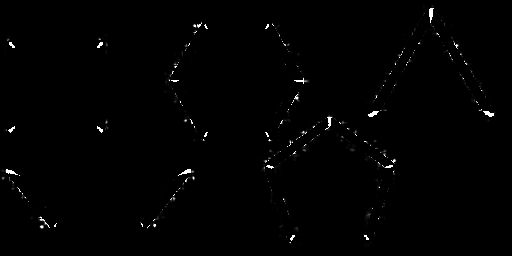

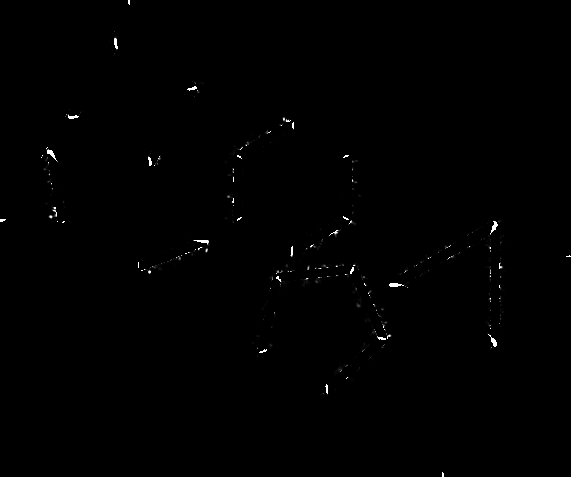

Puntos de interes


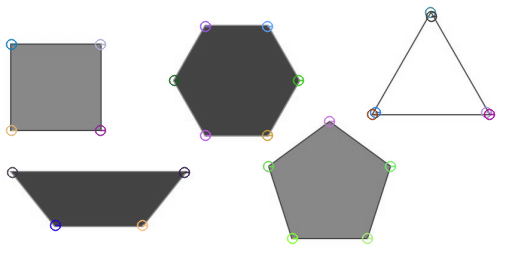

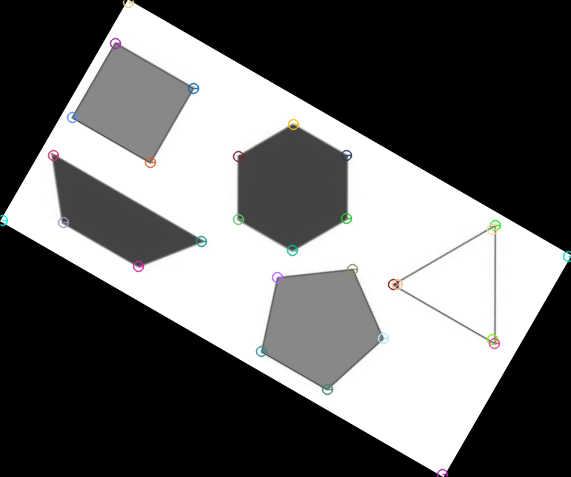

Resultados de filtro de Harris


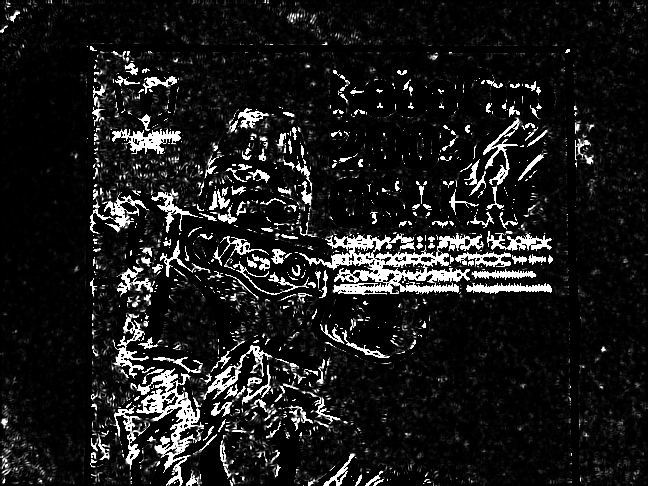

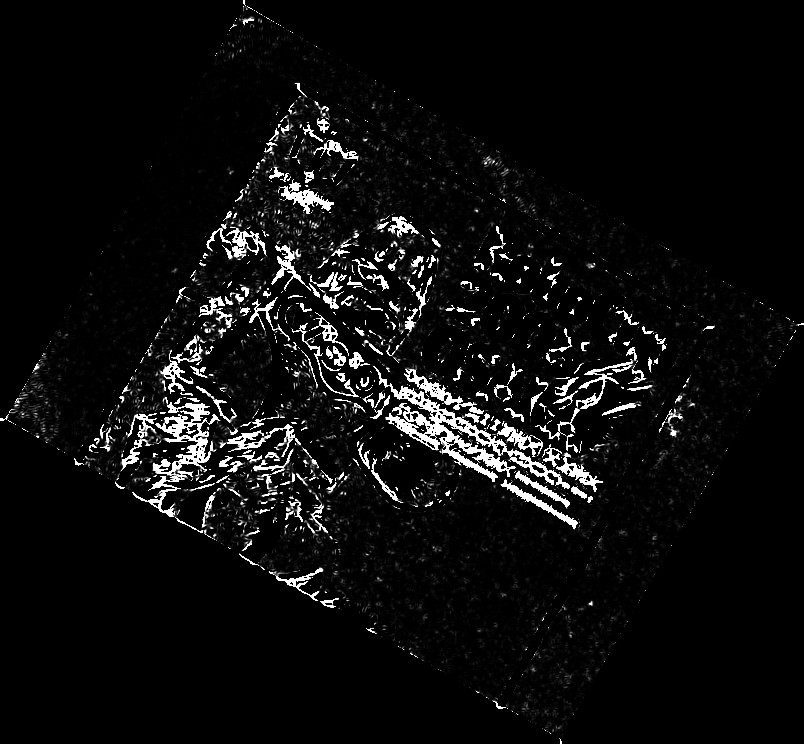

Puntos de interes


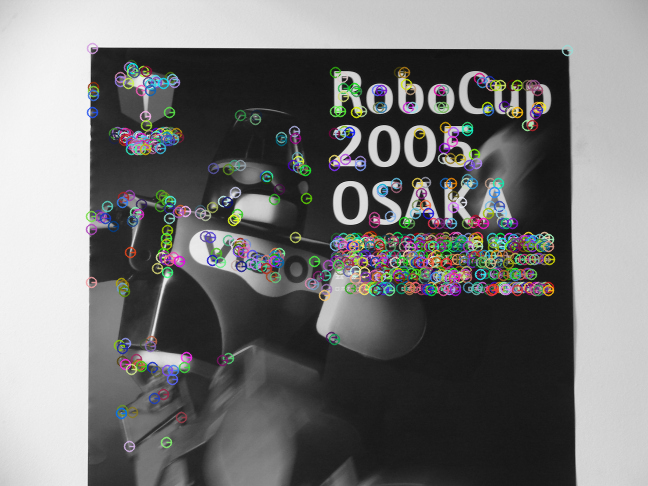

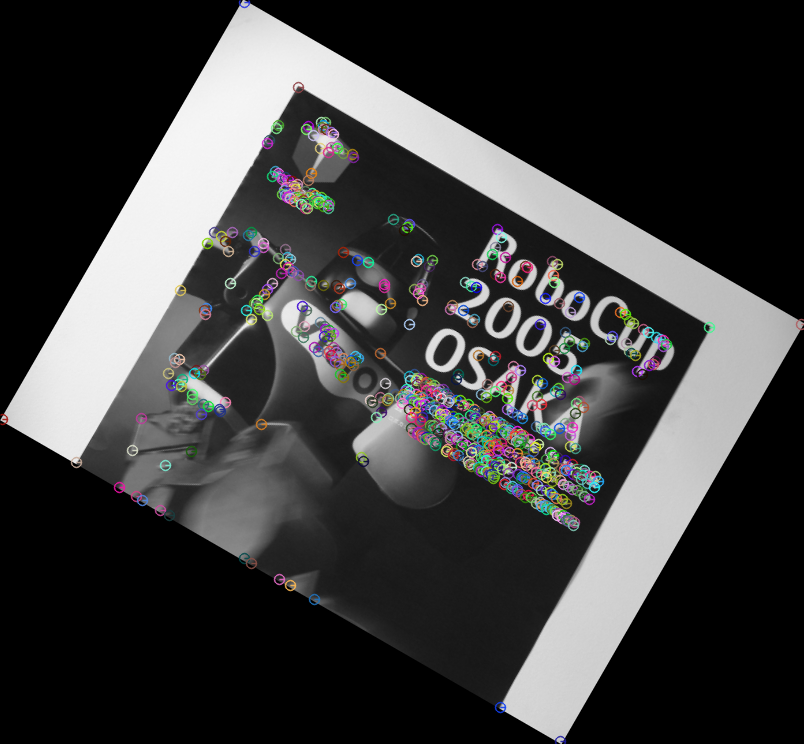

Resultados de filtro de Harris


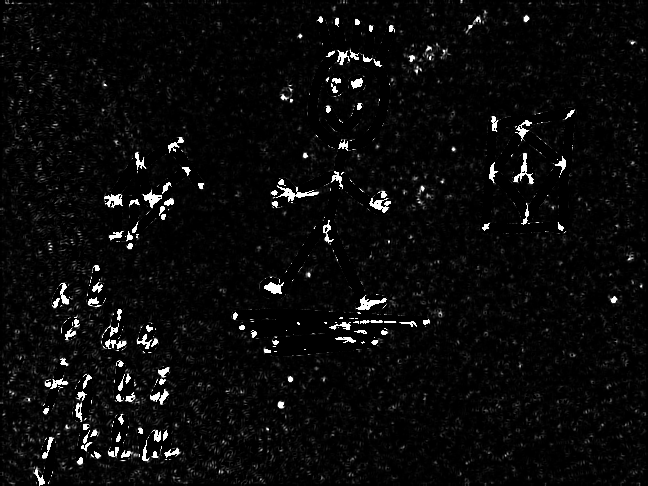

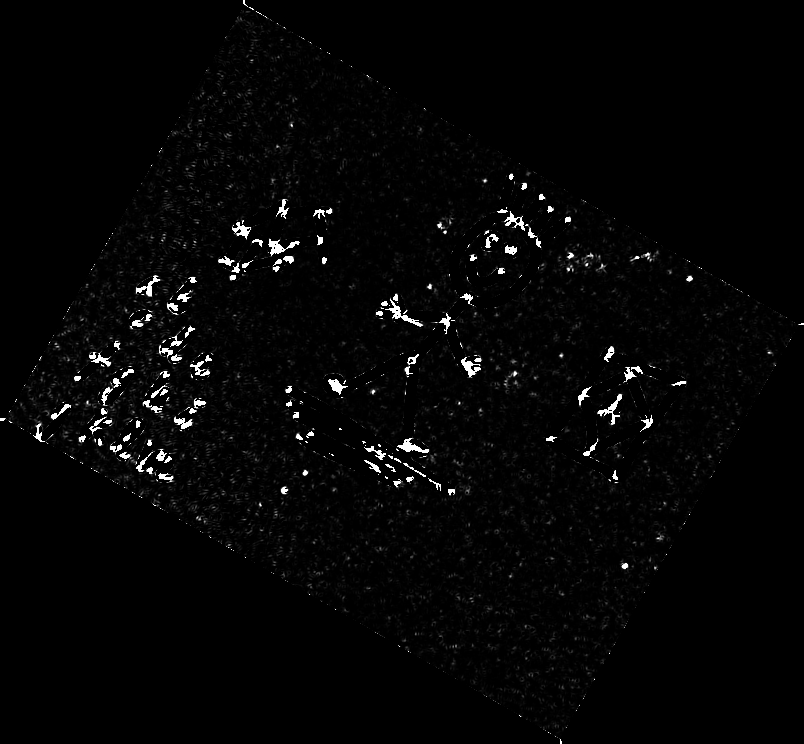

Puntos de interes


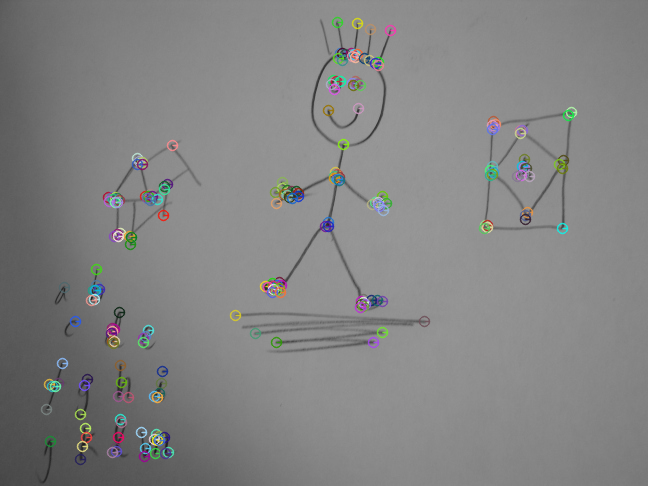

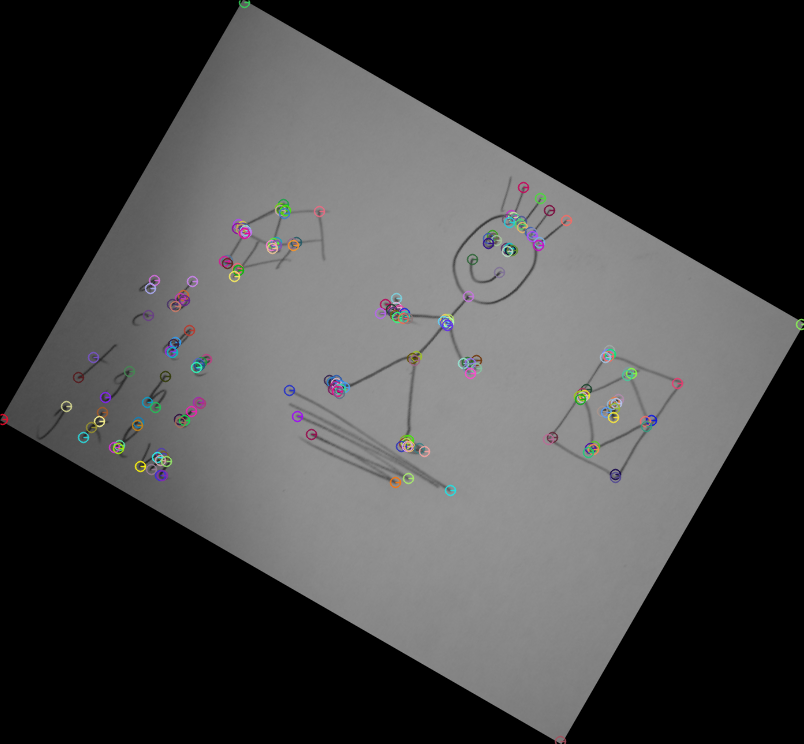

time: 56.1 s


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

for k in range(3):
  img1 = images[k]
  img2 = do_rotate(img1, 30)

  kp1, h1 = harrisDetector(img1, 3e6)
  kp2, h2 = harrisDetector(img2, 3e6)

  res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  print('Resultados de filtro de Harris')
  im_to_harris = h1 * 255 / np.max(np.max(h1))
  rotate_harris = h2 * 255 / np.max(np.max(h2))
  cv2_imshow(h1)
  cv2_imshow(h2)
  # cv2.imwrite('Harris_result_' + str(k) + '.png', h1)
  # cv2.imwrite('Harris_rotate_' + str(k) + '.png', h2)
  print('Puntos de interes')
  cv2_imshow(res1)
  cv2_imshow(res2)
  # cv2.imwrite('Harris_keys_' + str(k) + '.png', res1)
  # cv2.imwrite('Rotate_Harris_keys_' + str(k) + '.png', res2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in sqrt
  del sys.path[0]


Resultados de filtro de shiTomasi


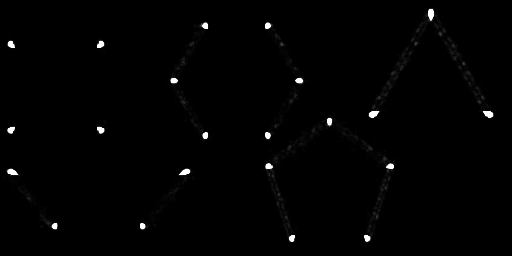

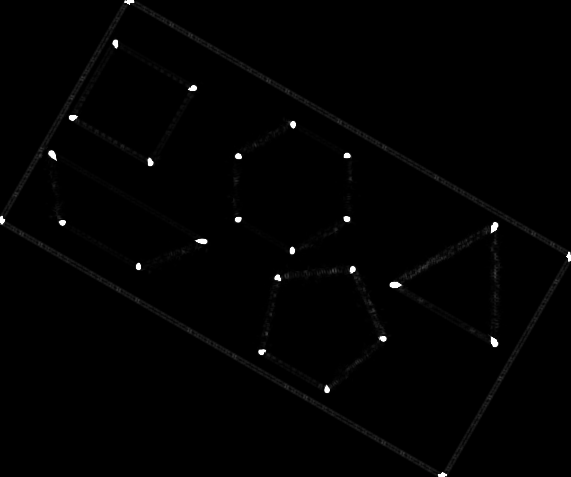

Puntos de interes


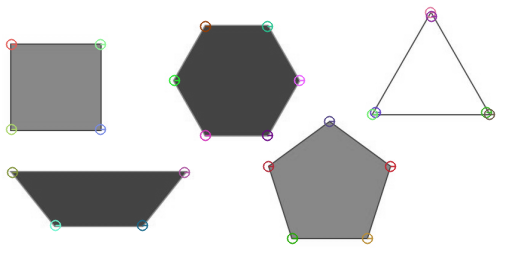

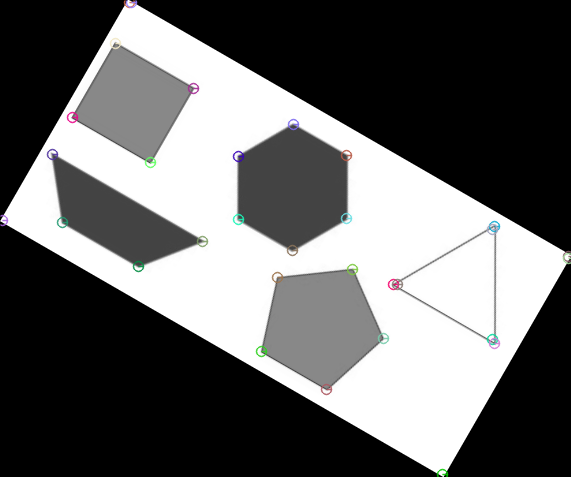

Resultados de filtro de shiTomasi


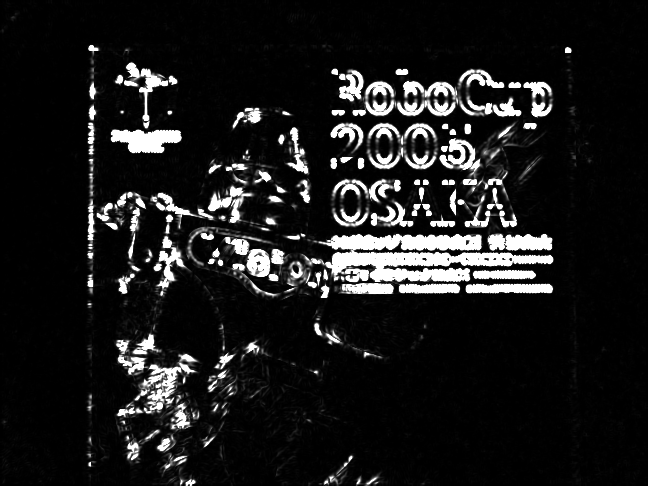

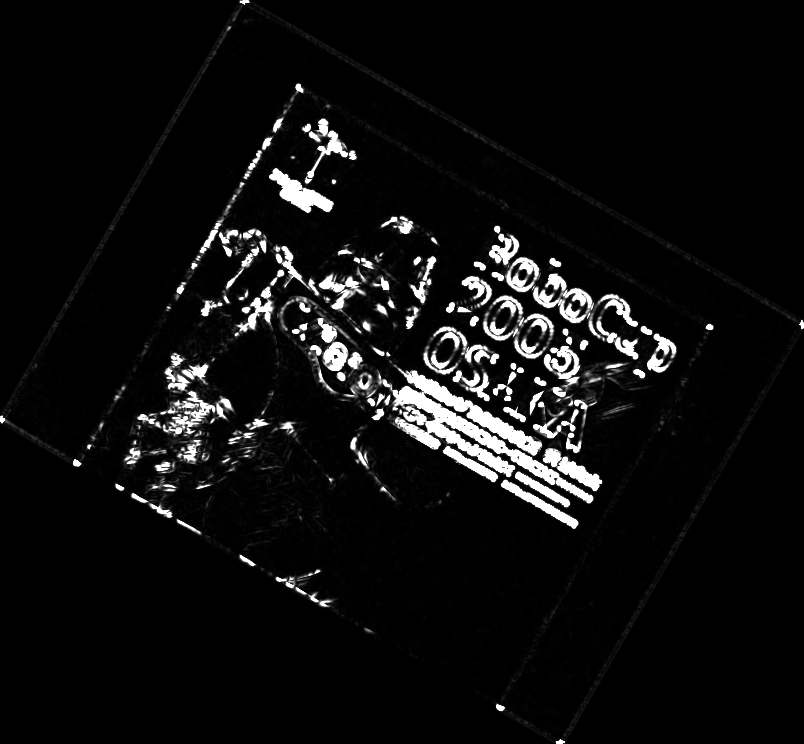

Puntos de interes


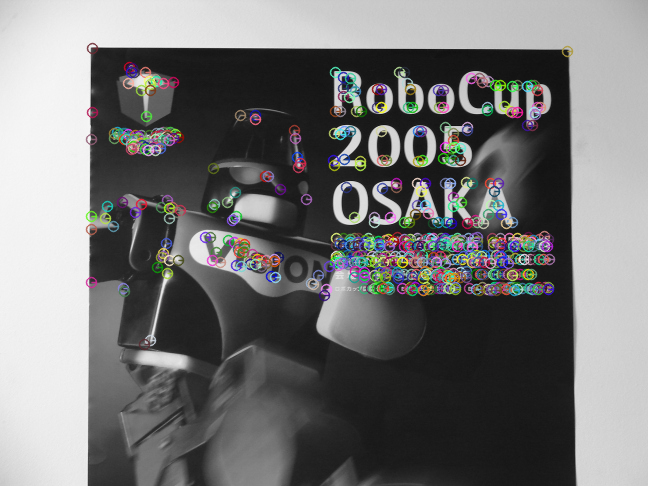

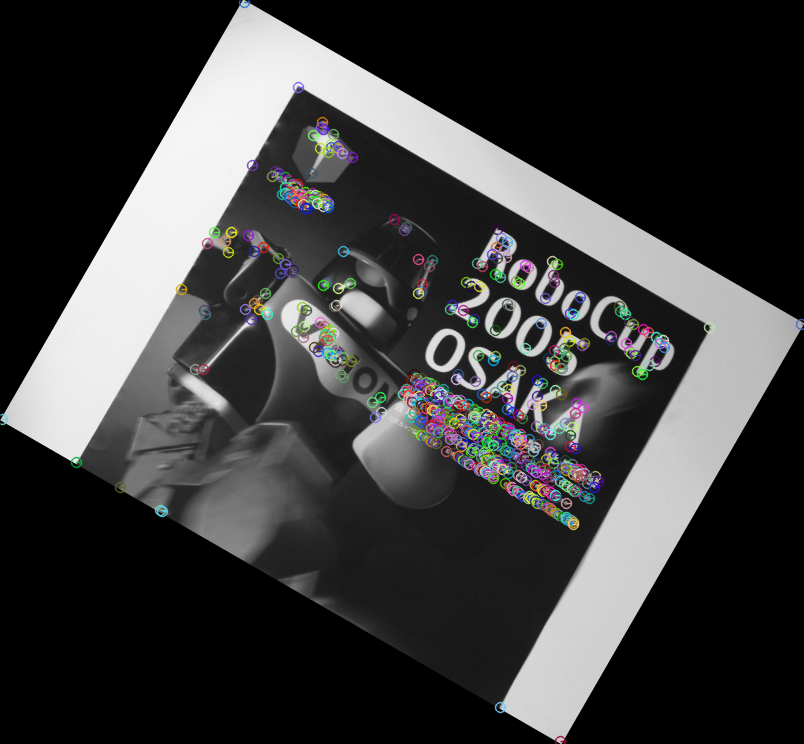

Resultados de filtro de shiTomasi


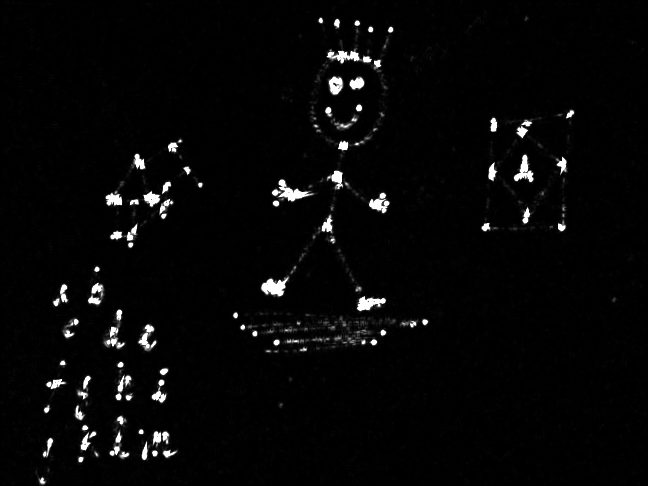

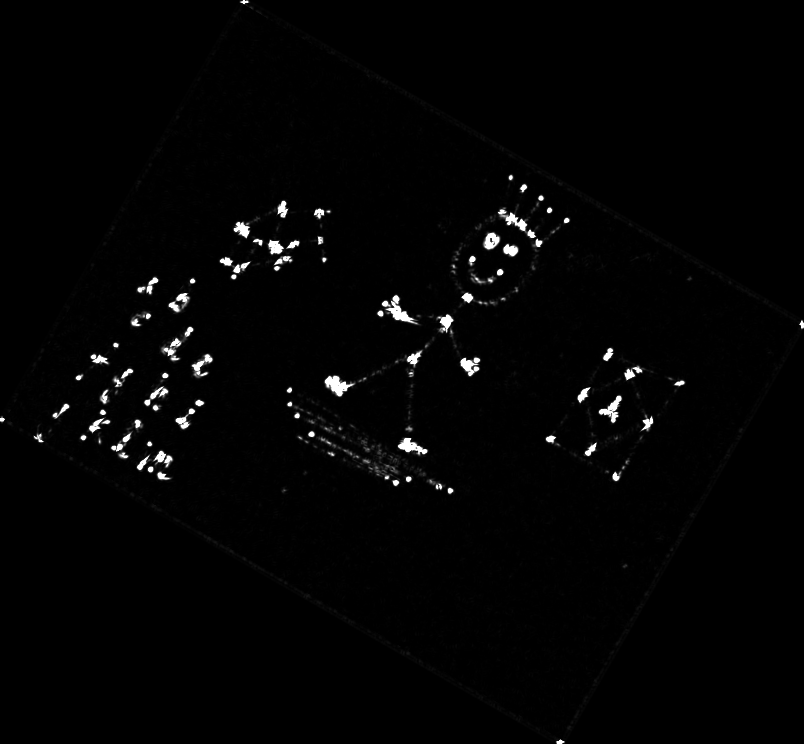

Puntos de interes


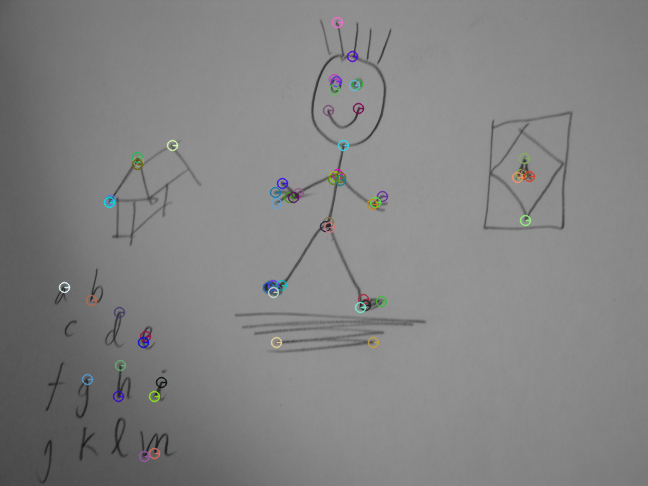

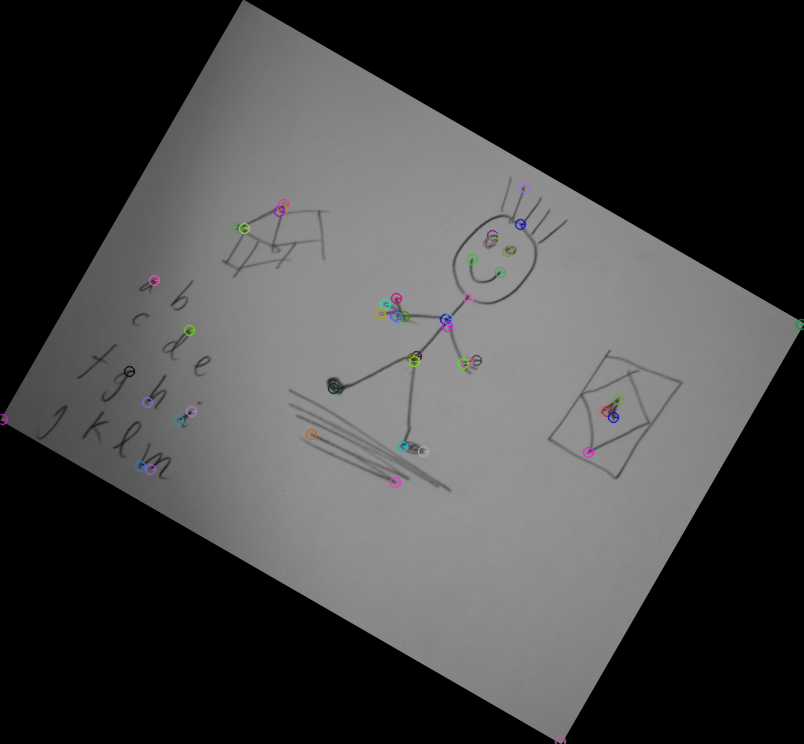

time: 56 s


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

for k in range(3):
  img1 = images[k]
  img2 = do_rotate(img1, 30)

  kp1, sT1 = shiTomasiDetector(img1, 3e3)
  kp2, sT2 = shiTomasiDetector(img2, 3e3)

  res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  print('Resultados de filtro de shiTomasi')
  # im_to_sT = sT1 * 100 / np.max(np.max(h1))
  # rotate_sT = sT2 * 100 / np.max(np.max(h2))
  cv2_imshow(sT1)
  cv2_imshow(sT2)
  # cv2.imwrite('ShiTomasi_result_' + str(k) + '.png', sT1)
  # cv2.imwrite('Shitomasi_rotate_' + str(k) + '.png', sT2)
  print('Puntos de interes')
  cv2_imshow(res1)
  cv2_imshow(res2)
  # cv2.imwrite('ShiTomasi_keys_' + str(k) + '.png', res1)
  # cv2.imwrite('Rotate_ShiTomasi_keys_' + str(k) + '.png', res2)

# **Parte 3**

In [ ]:
# Esta funcion ya esta lista, no debe ser modificada
def filterMatches(matches):
  # Apply ratio test
  points1 = []
  points2 = []
  good = []

  for m,n in matches:
    if m.distance < 0.75*n.distance:  # 0.75
      good.append([m])
      points1.append(kp1[m.queryIdx].pt)
      points2.append(kp2[m.trainIdx].pt)
  return np.array(points1), np.array(points2), good

time: 4.03 ms


#### Muestra de todas las imagenes fusionadas

Correspondencias para la imagen 1


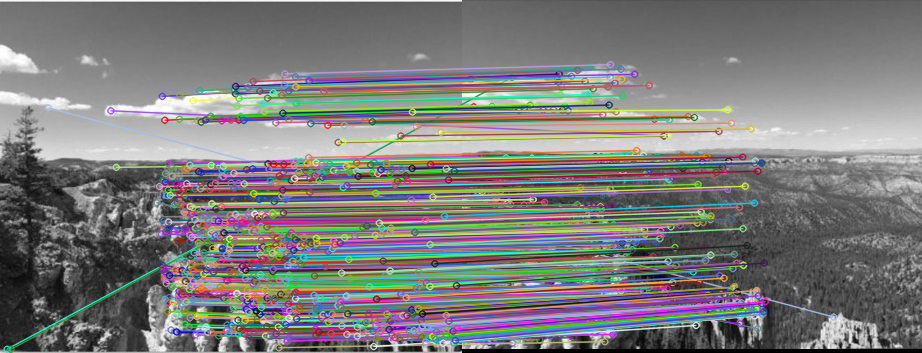

(353, 462) (349, 460)
Imagen fusionada 1


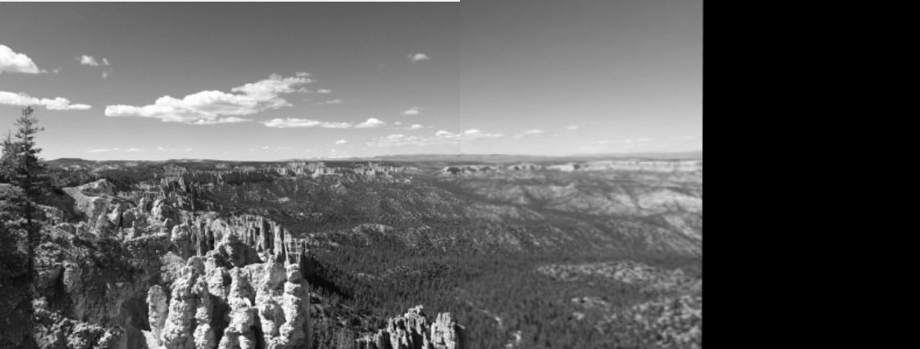

Correspondencias para la imagen 2


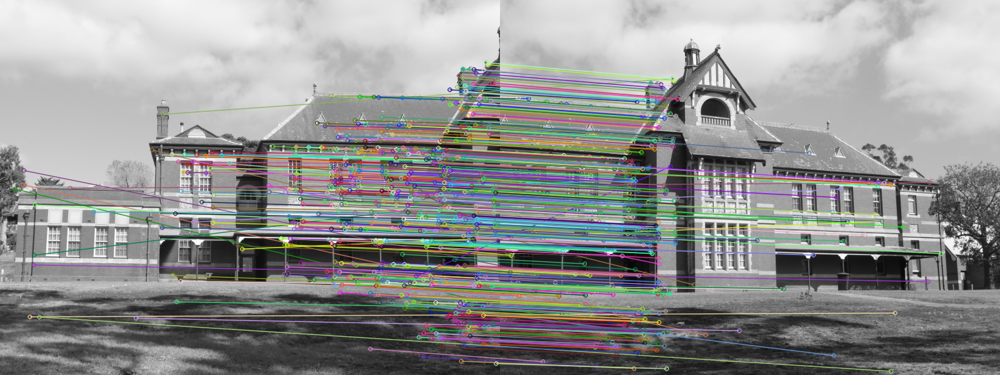

(600, 800) (600, 800)
Imagen fusionada 2


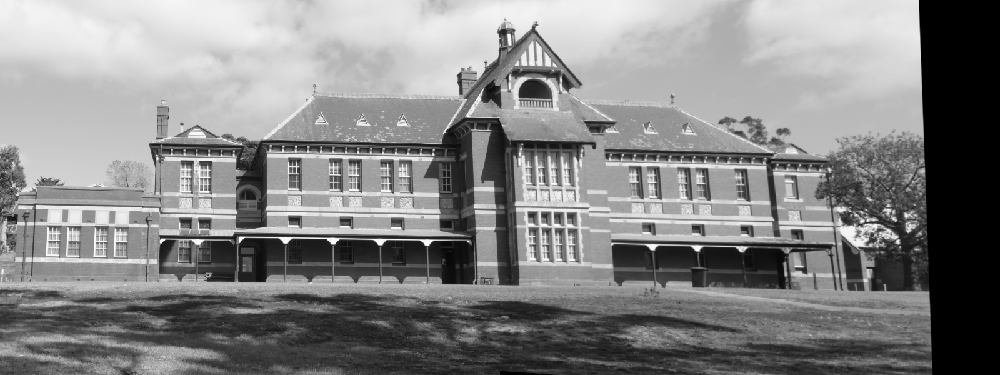

Correspondencias para la imagen 3


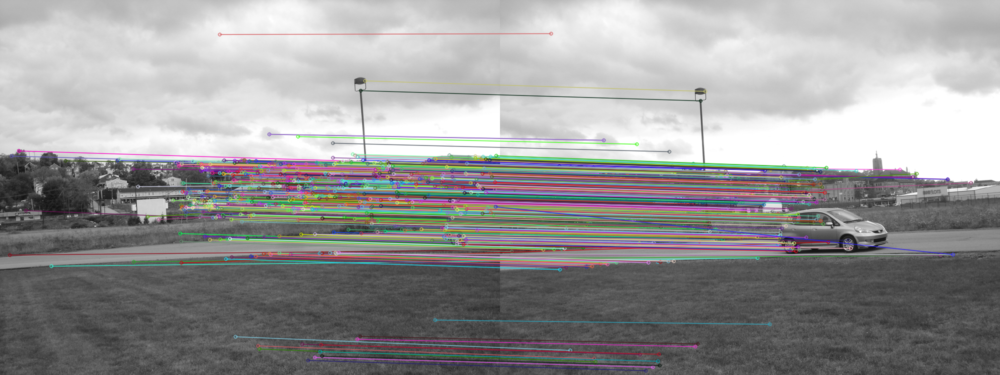

(750, 1000) (750, 1000)
Imagen fusionada 3


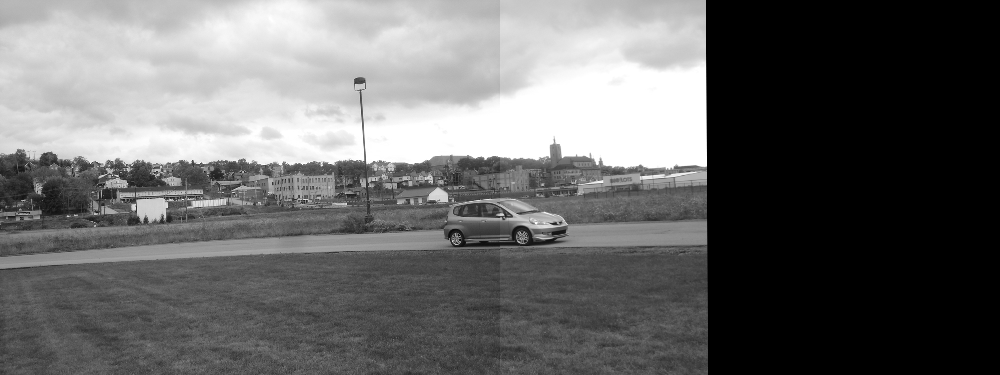

Correspondencias para la imagen 4


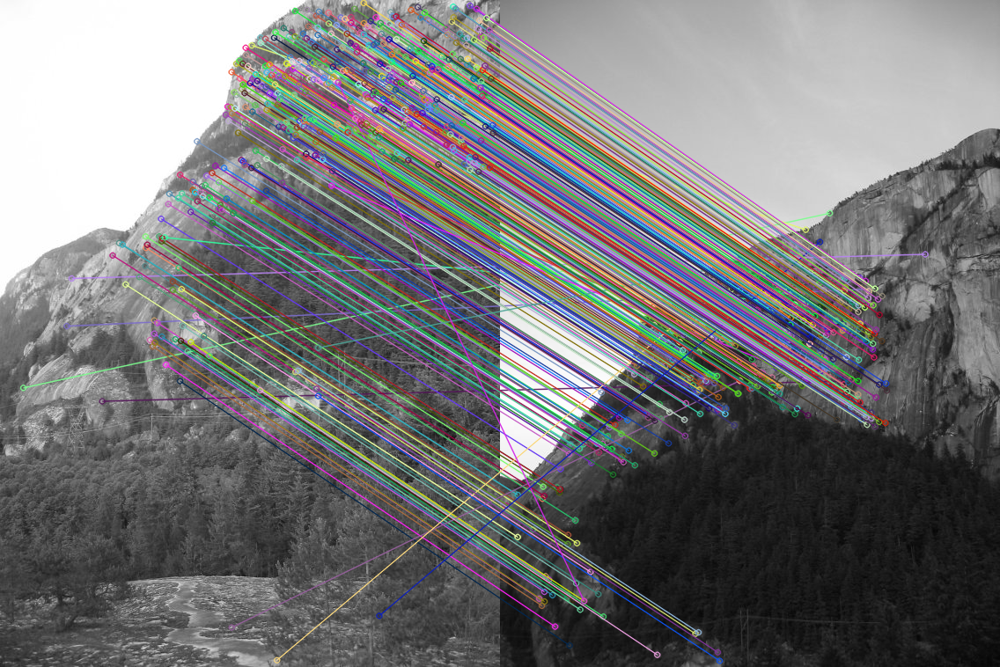

(758, 568) (758, 568)
Imagen fusionada 4


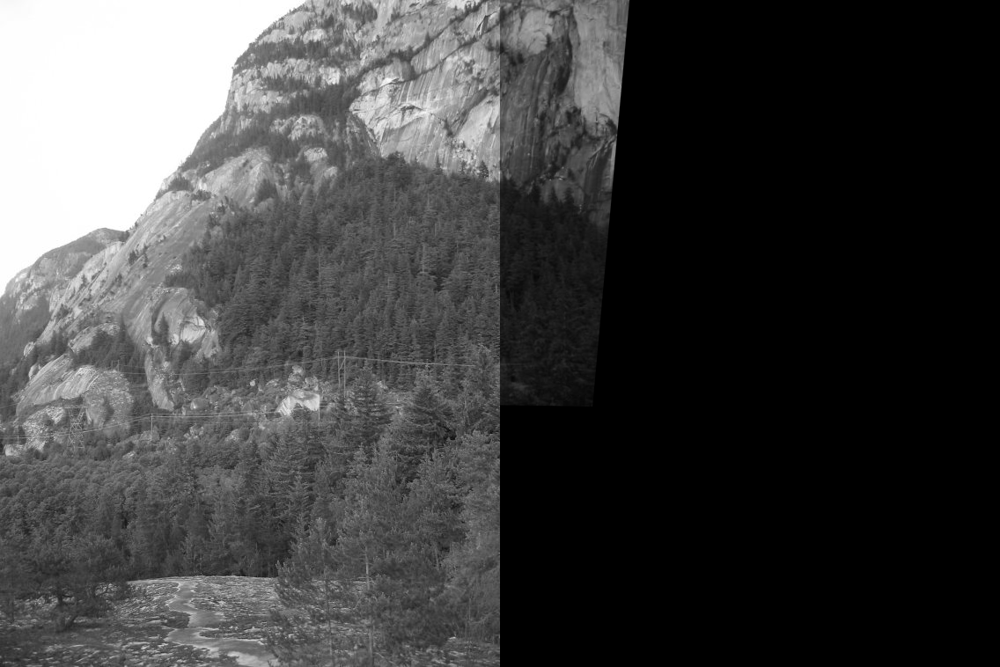

time: 4.88 s


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

""" Carga de imágenes. """

images_left = dict()
images_right = dict()

for k in range(1,5):
  if k == 1:
    images_left[k] = cv2.imread('left' + str(k) + '.png', 0)
    images_right[k] = cv2.imread('right' + str(k) + '.png', 0)
  else:
    images_left[k] = cv2.imread('left' + str(k) + '.jpg', 0)
    images_right[k] = cv2.imread('right' + str(k) + '.jpg', 0)

""" Muestra de correspondencias . """

for j in range(1,5):
  detector = cv2.SIFT_create()
  (kp1, des1) = detector.detectAndCompute(images_left[j], None)
  (kp2, des2) = detector.detectAndCompute(images_right[j], None)
  bf = cv2.BFMatcher()
  Matches = bf.knnMatch(des1, des2, k=2)
  points_left, points_right, Good = filterMatches(Matches)
  Im_match = cv2.drawMatchesKnn(images_left[j], kp1, images_right[j], kp2,
                                Good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  print('Correspondencias para la imagen ' + str(j))
  # cv2.imwrite('Matches_img_' + str(j) + '.png',Im_match)
  cv2_imshow(Im_match)

  M, mask = cv2.findHomography(points_right, points_left, cv2.RANSAC)
  h, w = images_right[j].shape
  print(np.shape(images_left[j]), np.shape(images_right[j]))
  im_wraped = cv2.warpPerspective(images_right[j], M=M, dsize=(2*w,h))
  im_wraped[:h,:w] = images_left[j][:h, :w]
  # cv2.imwrite('Fusion_image_' + str(j) + '.png', im_wraped)
  print('Imagen fusionada ' + str(j))
  cv2_imshow(im_wraped)

  